In [71]:
import sys
from PIL import Image
from math import pi,sin,cos,tan,atan2,hypot,floor
from numpy import clip
from matplotlib import pyplot as plt

imgIn = Image.open("/Users/amir/Desktop/ImageRecognition/Images/Moscow4k/Moscow3604k.jpeg")

# Functions defenition


In [72]:


# get x,y,z coords from out image pixels coords
# i,j are pixel coords
# face is face number
# edge is edge length
def outImgToXYZ(i,j,face,edge):
    a = 2.0*float(i)/edge
    b = 2.0*float(j)/edge
    if face==0: # back
        (x,y,z) = (-1.0, 1.0-a, 3.0 - b)
    elif face==1: # left
        (x,y,z) = (a-3.0, -1.0, 3.0 - b)
    elif face==2: # front
        (x,y,z) = (1.0, a - 5.0, 3.0 - b)
    elif face==3: # right
        (x,y,z) = (7.0-a, 1.0, 3.0 - b)
    elif face==4: # top
        (x,y,z) = (b-1.0, a -5.0, 1.0)
    elif face==5: # bottom
        (x,y,z) = (5.0-b, a-5.0, -1.0)
    return (x,y,z)

# convert using an inverse transformation
def convertBack(imgIn,imgOut):
    inSize = imgIn.size
    outSize = imgOut.size
    inPix = imgIn.load()
    outPix = imgOut.load()
    edge = inSize[0]/4   # the length of each edge in pixels
    for i in range(outSize[0]):
        face = int(i/edge) # 0 - back, 1 - left 2 - front, 3 - right
        if face==2:
            rng = range(0,int(edge*3))
        else:
            rng = range(int(edge), int(edge) * 2)

        for j in rng:
            if j<edge:
                face2 = 4 # top
            elif j>=2*edge:
                face2 = 5 # bottom
            else:
                face2 = face

            (x,y,z) = outImgToXYZ(i,j,face2,edge)
            theta = atan2(y,x) # range -pi to pi
            r = hypot(x,y)
            phi = atan2(z,r) # range -pi/2 to pi/2
            # source img coords
            uf = ( 2.0*edge*(theta + pi)/pi )
            vf = ( 2.0*edge * (pi/2 - phi)/pi)
            # Use bilinear interpolation between the four surrounding pixels
            ui = floor(uf)  # coord of pixel to bottom left
            vi = floor(vf)
            u2 = ui+1       # coords of pixel to top right
            v2 = vi+1
            mu = uf-ui      # fraction of way across pixel
            nu = vf-vi
            # Pixel values of four corners
            # import sys
            # print('inPix ->', inPix)
            # print('ui ->', ui)
            # print('inSize[0]', inSize[0])
            # bar = clip(vi,0,inSize[1]-1)
            # print('bar ->', bar, type(bar), int(bar))
            # baz = ui % inSize[0]
            # print('baz ->', baz, type(baz))
            # foo = inPix[ui % inSize[0], bar]
            # sys.exit(-1)
            A = inPix[ui % inSize[0],int(clip(vi,0,inSize[1]-1))]
            B = inPix[u2 % inSize[0],int(clip(vi,0,inSize[1]-1))]
            C = inPix[ui % inSize[0],int(clip(v2,0,inSize[1]-1))]
            D = inPix[u2 % inSize[0],int(clip(v2,0,inSize[1]-1))]
            # interpolate
            (r,g,b) = (
              A[0]*(1-mu)*(1-nu) + B[0]*(mu)*(1-nu) + C[0]*(1-mu)*nu+D[0]*mu*nu,
              A[1]*(1-mu)*(1-nu) + B[1]*(mu)*(1-nu) + C[1]*(1-mu)*nu+D[1]*mu*nu,
              A[2]*(1-mu)*(1-nu) + B[2]*(mu)*(1-nu) + C[2]*(1-mu)*nu+D[2]*mu*nu )

            outPix[i,j] = (int(round(r)),int(round(g)),int(round(b)))



# Running

In [73]:
inSize = imgIn.size
i1 = inSize[0]
imgOut = Image.new("RGB",(inSize[0],int(inSize[0]*3/4)),"black")
convertBack(imgIn,imgOut)


# Save cubemap

In [74]:
imgOut.save("/Users/amir/Desktop/ImageRecognition/Images/Moscow4k/cubemap.jpg")

# Show result

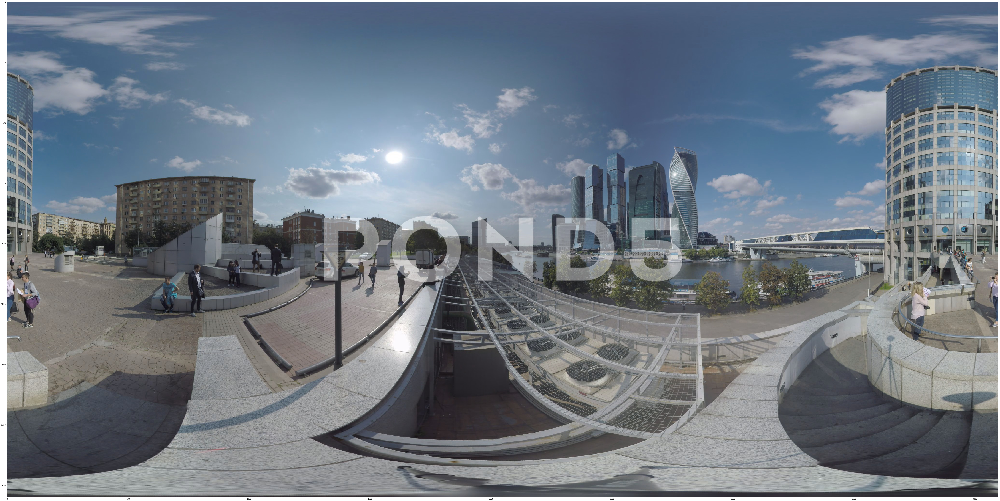

In [75]:
plt.figure(figsize=(100, 100))
plt.imshow(imgIn, 'gray'),plt.show()
imgOut.show()